# Trabalho Final - Análise de Dados com Python

Integrantes:

    1) RM: - Devis
    2) RM: - Eduardo
    3) RM: - Eudes
    4) RM: 341778 - Nilo José de Andrade Neto

### Enunciado

A partir dos dados housing.csv, realize toda análise exploratória necessária e prepare os dados para algoritmos de machine learning usando a Scikit-Learn. Treine um modelo de regressão linear que prediga a variável meta (median_house_value) e cujo valor de RMSE seja menor ou igual a 69000. 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 

In [2]:
# leitura dos dados
data = pd.read_csv('bases/housing.csv')
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [4]:
data['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [5]:
print(data.describe())

longitude      latitude  housing_median_age   total_rooms  \
count  20640.000000  20640.000000        20640.000000  20640.000000   
mean    -119.569704     35.631861           28.639486   2635.763081   
std        2.003532      2.135952           12.585558   2181.615252   
min     -124.350000     32.540000            1.000000      2.000000   
25%     -121.800000     33.930000           18.000000   1447.750000   
50%     -118.490000     34.260000           29.000000   2127.000000   
75%     -118.010000     37.710000           37.000000   3148.000000   
max     -114.310000     41.950000           52.000000  39320.000000   

       total_bedrooms    population    households  median_income  \
count    20433.000000  20640.000000  20640.000000   20640.000000   
mean       537.870553   1425.476744    499.539680       3.870671   
std        421.385070   1132.462122    382.329753       1.899822   
min          1.000000      3.000000      1.000000       0.499900   
25%        296.000000    787.0

In [6]:
data.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

array([[<AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'housing_median_age'}>],
       [<AxesSubplot:title={'center':'total_rooms'}>,
        <AxesSubplot:title={'center':'total_bedrooms'}>,
        <AxesSubplot:title={'center':'population'}>],
       [<AxesSubplot:title={'center':'households'}>,
        <AxesSubplot:title={'center':'median_income'}>,
        <AxesSubplot:title={'center':'median_house_value'}>]],
      dtype=object)

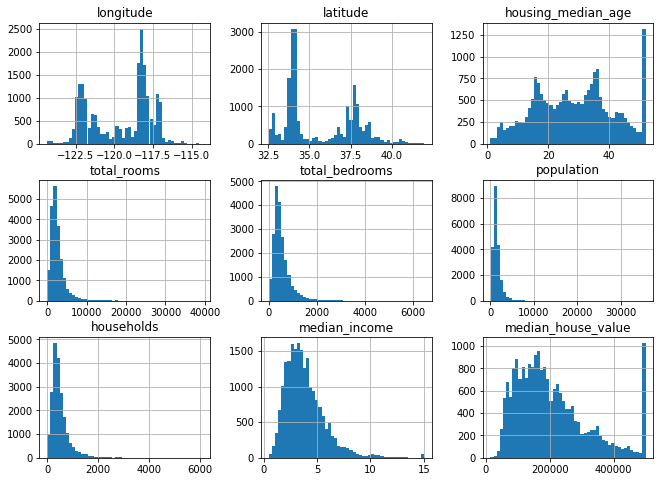

In [7]:
data.hist(bins=50, figsize=(11,8))

<AxesSubplot:>

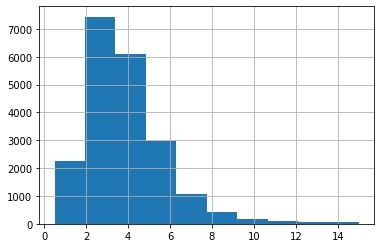

In [8]:
data['median_income'].hist() #renda 

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

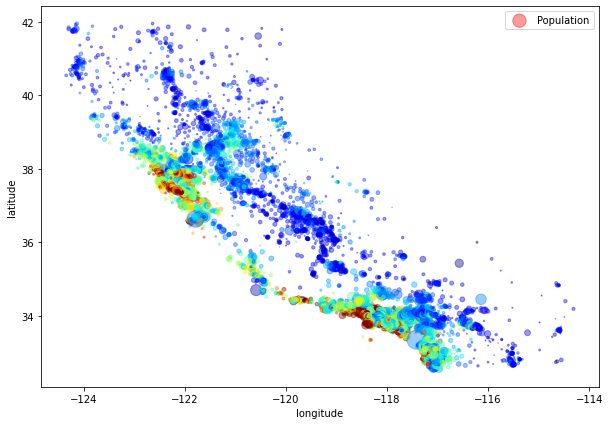

In [9]:
data.plot(kind="scatter", x="longitude", y="latitude", figsize=(10,7),
                       s=data['population']/100, label="Population",
                       c="median_house_value", cmap=plt.get_cmap("jet"),
                       colorbar=False, alpha=0.4,
                      )

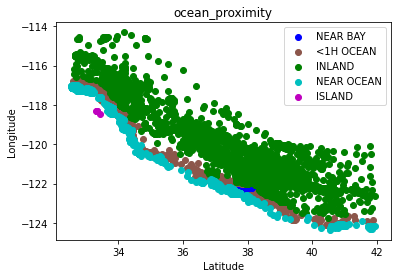

In [10]:
proximities = data['ocean_proximity'].unique().tolist()
#'NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'
colors = ['b','tab:brown','g','c','m']
positions = {}
for p in proximities:
    positions[p] = {'x': data['latitude'][data['ocean_proximity'] == p].values.tolist(),
                    'y': data['longitude'][data['ocean_proximity'] == p].values.tolist()}

fig, ax = plt.subplots()
plt.title('ocean_proximity')
plt.xlabel('Latitude')
plt.ylabel('Longitude')

scatter_list = []
for i,v in enumerate(positions):
    p = plt.scatter(positions[v]['x'], positions[v]['y'], color=colors[i])
    scatter_list.append(p)
    
plt.legend(scatter_list,positions,loc='best')
plt.show()

<AxesSubplot:xlabel='median_income', ylabel='median_house_value'>

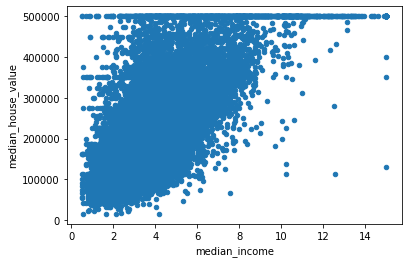

In [11]:
data.plot(kind="scatter", x="median_income", y="median_house_value")
#valor medio renda vs valor medio casa  

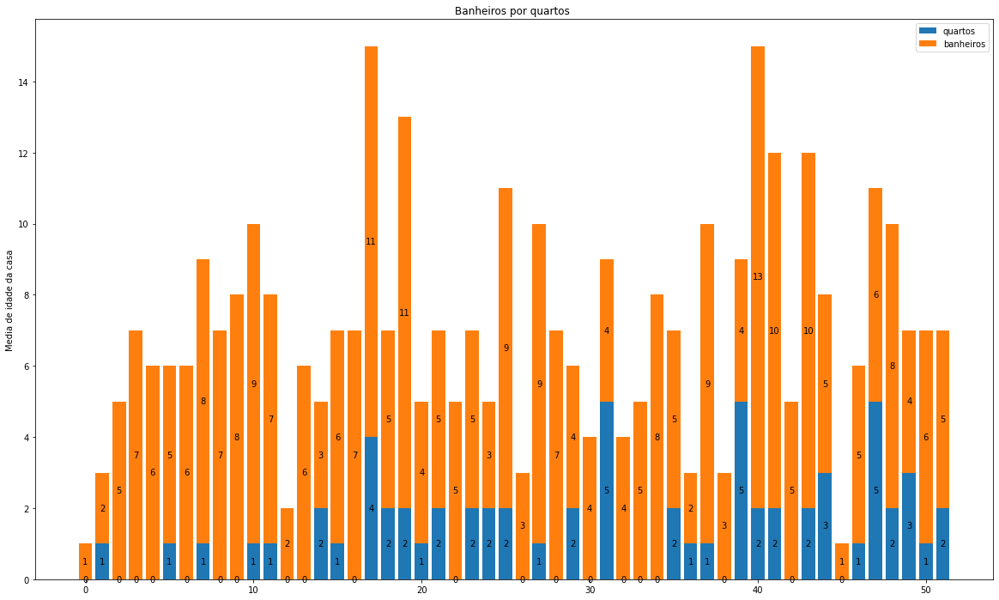

In [12]:
quartos = []
banheiros = []
data_copy = data.copy()
data_copy.dropna(how='all')

for i in range(len(data_copy['housing_median_age'].unique())):
    quarto = data_copy[data_copy['total_rooms']==i+1]
    banheiro = data_copy[data_copy['total_bedrooms']==i+1]
    
    quartos.append(len(quarto))
    banheiros.append(len(banheiro))
    
width = 0.80       
index = np.arange(len(quartos))
qtd_quartos=np.array(quartos)
qtd_banheiros=np.array(banheiros)

plt.figure(figsize=(20,12))

p1 = plt.bar(index, qtd_quartos, width)
p2 = plt.bar(index, qtd_banheiros, width,
             bottom=qtd_quartos)

plt.ylabel('Media de idade da casa')
plt.title('Banheiros por quartos ')
plt.legend((p1[0], p2[0]), ('quartos', 'banheiros'))

for x,y,val in zip(index,qtd_quartos/2, qtd_quartos):
    plt.text(x, y, "%.1d"%val, ha="center", va="center")
for x,y,val in zip(index,qtd_quartos+qtd_banheiros/2, qtd_banheiros):
    plt.text(x, y, "%.1d"%val, ha="center", va="center")



<AxesSubplot:>

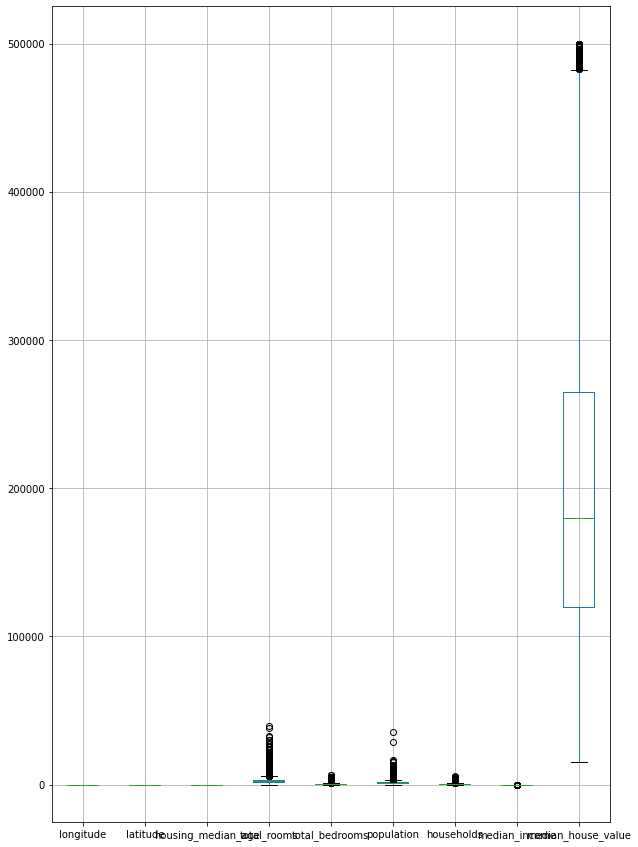

In [13]:
data.boxplot(figsize = (10,15))

In [14]:
data['ocean_proximity'].replace({'INLAND':0, 'NEAR OCEAN':0.9, 'ISLAND':1, '<1H OCEAN':0.5, 'NEAR BAY':0.7}, inplace=True)

In [15]:
#data.head()
corr_matrix = data.corr()
corr_matrix['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
ocean_proximity       0.455671
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

In [16]:
#data = data.drop(['population','longitude','latitude'], axis=1)
data_features = data.drop('median_house_value', axis=1)
data_labels = data['median_house_value'].copy()

In [17]:
data_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   ocean_proximity     20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [18]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
#imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
#imputer = SimpleImputer(missing_values=np.nan, strategy='median')


In [19]:
#data_features_num = data_features.drop('ocean_proximity',axis=1)
data_features_num = data_features

In [20]:
data_features_num.head(n=3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,0.7
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,0.7
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,0.7


In [21]:
imputer.fit(data_features_num)

SimpleImputer(strategy='most_frequent')

In [22]:
imputer.statistics_

array([-1.1831e+02,  3.4060e+01,  5.2000e+01,  1.5270e+03,  2.8000e+02,
        8.9100e+02,  3.0600e+02,  3.1250e+00,  5.0000e-01])

In [23]:
X = imputer.transform(data_features_num) # o resultado é um numpy.array. Precisamos converter para DataFrame
data_features_num = pd.DataFrame(X, columns=data_features_num.columns)
data_features_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20640 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   ocean_proximity     20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [24]:
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, MinMaxScaler
from sklearn.base import BaseEstimator, TransformerMixin

class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

num_attribs = list(data_features_num)
#cat_attribs = ['ocean_proximity']

num_pipeline = Pipeline([
    ('selector', DataFrameSelector(num_attribs)),
    #('imputer', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ('imputer', imputer ),
    ('std_scaler', MinMaxScaler()),
])
#cat_pipeline = Pipeline([
#    ('selector', DataFrameSelector(cat_attribs)),
#    ('categorial_encoder', OrdinalEncoder())
#    ])
full_pipeline = FeatureUnion(transformer_list=[
    ("num_pipeline", num_pipeline),
#    ("cat_pipeline", cat_pipeline),
])


In [25]:
data_features_prepared = full_pipeline.fit_transform(data_features)

In [26]:
data_features_prepared[0:5,:]

array([[0.21115538, 0.5674814 , 0.78431373, 0.02233074, 0.01986344,
        0.00894083, 0.02055583, 0.53966842, 0.7       ],
       [0.21215139, 0.565356  , 0.39215686, 0.18050257, 0.17147734,
        0.0672104 , 0.18697583, 0.53802706, 0.7       ],
       [0.21015936, 0.5642933 , 1.        , 0.03726029, 0.02932961,
        0.01381765, 0.02894261, 0.46602805, 0.7       ],
       [0.20916335, 0.5642933 , 1.        , 0.03235159, 0.03631285,
        0.01555537, 0.03584937, 0.35469856, 0.7       ],
       [0.20916335, 0.5642933 , 1.        , 0.04132967, 0.04329609,
        0.01575156, 0.04242723, 0.23077613, 0.7       ]])

In [27]:
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

In [28]:
X = data_features_prepared
y = data_labels.values
split_test_size = 0.20

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=split_test_size)

In [30]:
lr_model = linear_model.LinearRegression()
lr_model.fit(X_train, y_train.ravel()) 

LinearRegression()

In [31]:
y_pred = lr_model.predict(X_test)

In [32]:
import math
print('RMSE: {}'.format(str(int(math.sqrt(mean_squared_error(y_test,y_pred))))))

RMSE: 69330


In [33]:
print('score: {}%'.format(str(int(lr_model.score(X_test,y_test)*100))))

score: 64%
